In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow

/home/hardy/anaconda3/envs/ia/lib/python3.6/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
fichas_1 = cv2.imread('Fichas_1.png')
fichas_2 = cv2.imread('Fichas_2.png')

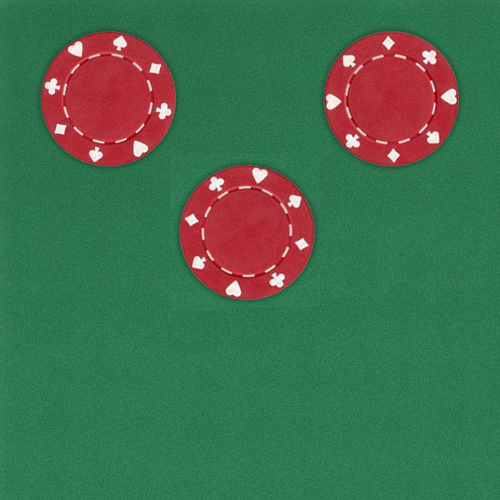

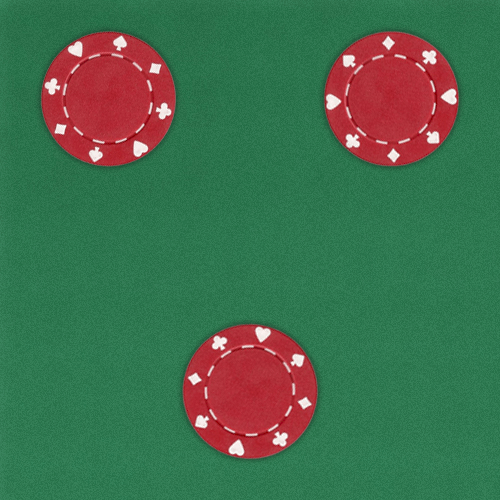

In [3]:
cv2_imshow(fichas_1)
cv2_imshow(fichas_2)

# ADDING IMAGES


In [4]:
imagem_res = cv2.add(fichas_1, fichas_2)

In [5]:
fichas_1.shape

(500, 500, 3)

HOW WE CAN SEE IN THE BLOCK ABOVE THE PICTURES_1 IMAGE HAS 3 DIMENSIONS OR IS IT RGB
 THE RESULTING IMAGE imagem_res BECOME LARGE ON THE CHICKS THAT WERE NOT IN THE SAME POSITION BECAUSE WE HAVE A PICTURE LIKE SHEET_2 WHICH SHEET IS IN THE BOTTOM OF THE PICTURE WHILE /
 WE ADD THIS IMAGE WITH AN IMAGE THAT IN THE POSITION OF THE SHEET THERE IS AN AREA OF GREEN COLOR WE ADD THE RGB COLORS IN THE RESULTING IMAGE OR WHICH THE SHEET WAS PREDOMINATING THE RED COLOR WHEN WE ADD THE GREEN COLOR /
 SHE IS DENINATED THE PREDOMINANCE OF THE RED COLOR AT THAT POINT, THEREFORE THE IMAGE IN THE POSITION OF THE FORM IS LIGHTENER

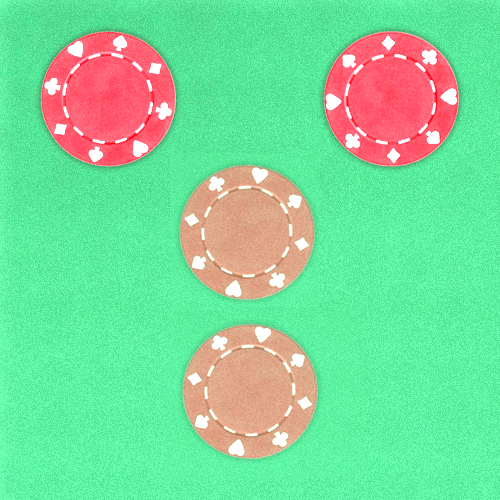

In [6]:
cv2_imshow(imagem_res)

# ADDING AN IMAGE TO ANOTHER

In [7]:
imagem_add_1 = cv2.addWeighted(fichas_1, 1, fichas_2, 0.2, 0)

Parameter alṕha is the weight of the source image and the beta parameter is the weight of the second source image gamma lighter or darker, these alpha and beta parameters are related to how much force we are applying to the respective images, it would be the intensity that is applied the image.


In [8]:
imagem_add_2 = cv2.addWeighted(fichas_1, 0.1, fichas_2, 0.9, 0)

In [9]:
imagem_add_3 = cv2.addWeighted(fichas_1, 0.5, fichas_2, 0.3, 0)

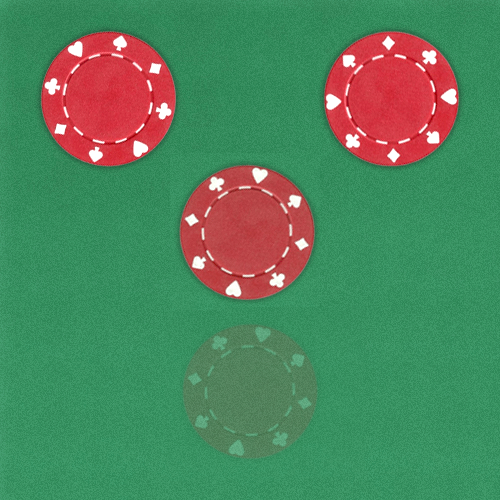

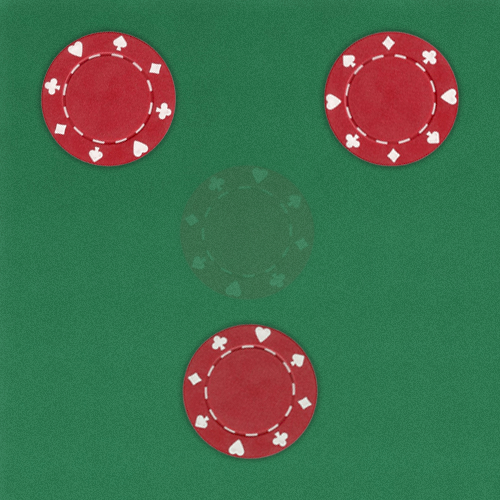

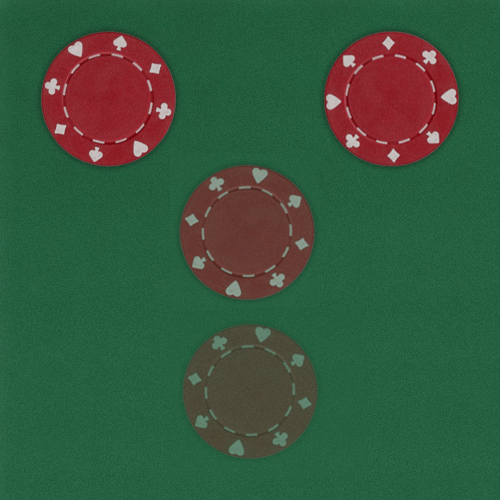

In [10]:
cv2_imshow(imagem_add_1)
cv2_imshow(imagem_add_2)
cv2_imshow(imagem_add_3)

# Subtraction


In [11]:
imagem_sub = cv2.subtract(fichas_1, fichas_2)

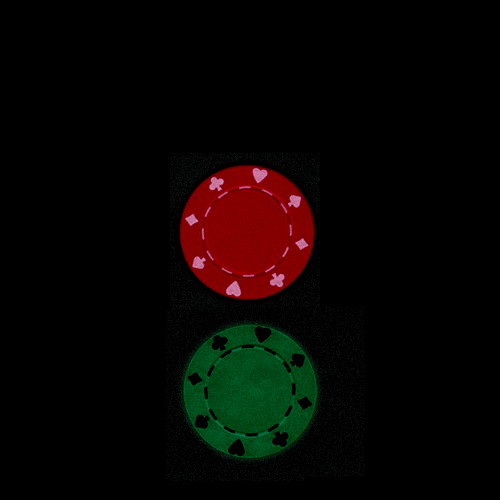

In [12]:
cv2_imshow(imagem_sub)

In the case of subtraction, we are working with an image that is rgb, that is, there are 3 dimensions of colors. when we do the subtraction the resulting value at that point is zero, that is to say the equal points between the two black images because the RGB matrices are zeroed [0,0,0]


# 4

To find the errors in a game of seven errors we can use the subtraction method between the two images in order to find the different points between them


In [13]:
time = cv2.imread('time.jpg')

In [14]:
y, x, rgb = time.shape

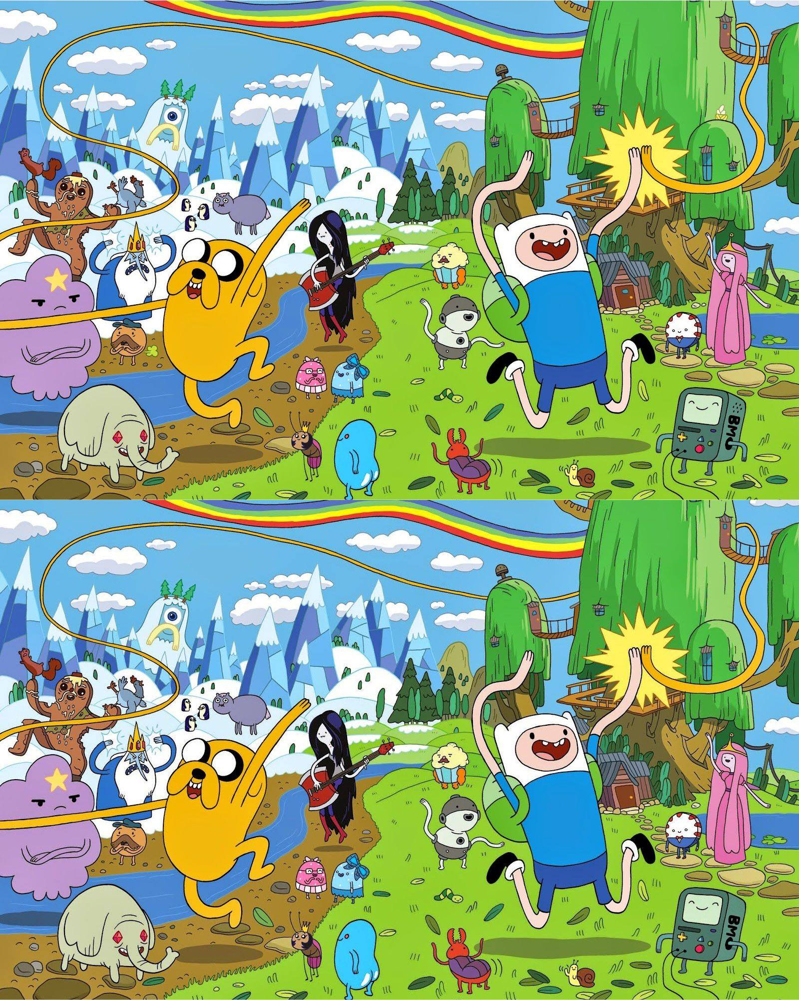

In [15]:
cv2_imshow(time)

In [16]:
time_1 = time[0:int(y/2), 0:x]
time_2 = time[int(y/2):y, 0:x]

In [17]:
time_sub = cv2.subtract(time_1, time_2)

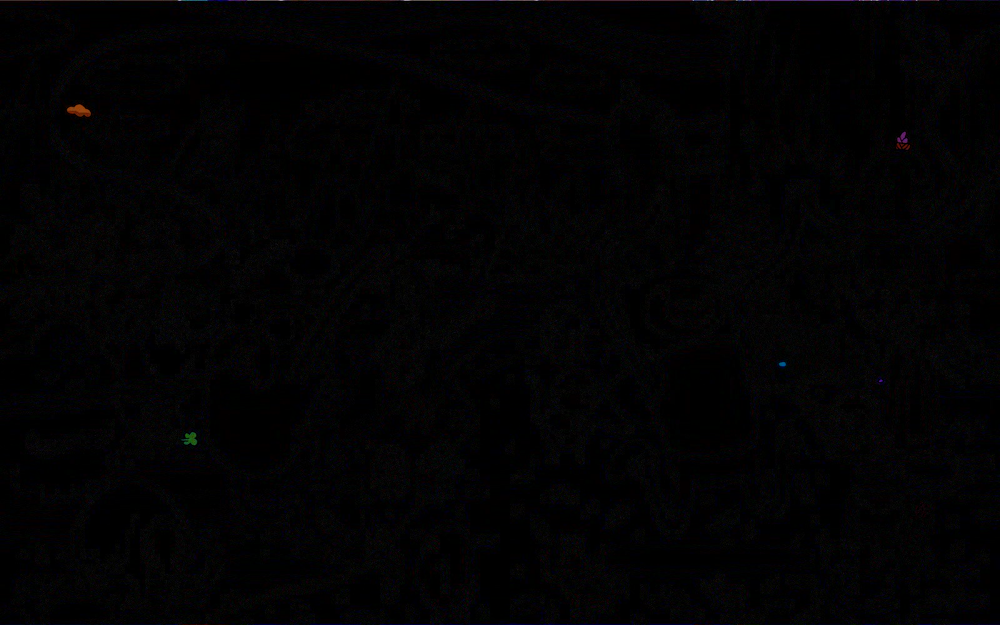

In [18]:
cv2_imshow(time_sub)

In this subtraction 5 errors were found

In [36]:
time_sub2 = cv2.subtract(time_2, time_1)

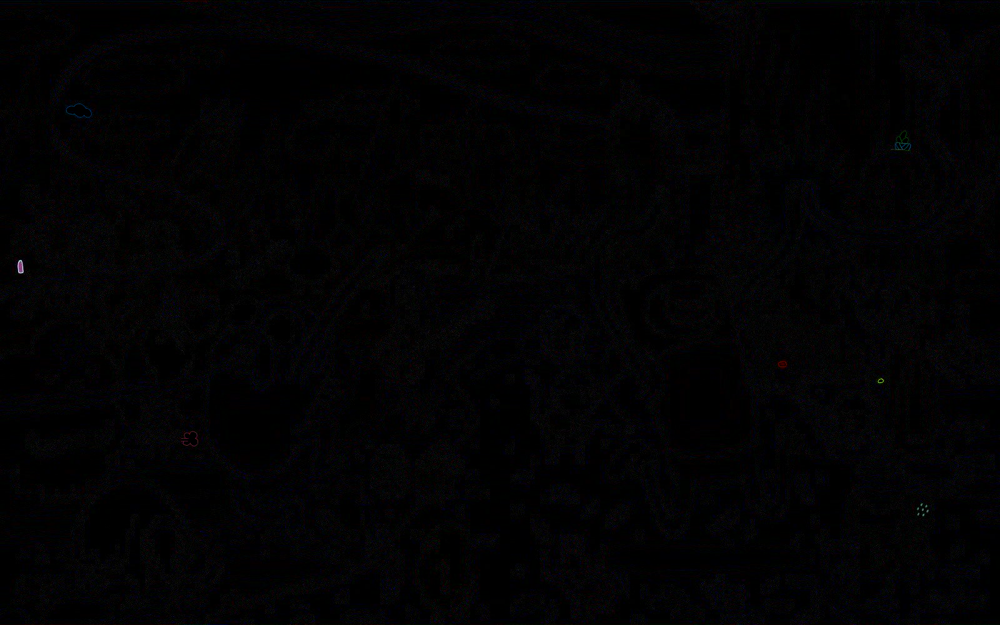

In [37]:
cv2_imshow(time_sub2)

The differences between the images were found by subtracting them because in this way the points where they are the same in the images are black and we can identify the points that are not the same in the two images


# CONTRAST ADJUSTMENT


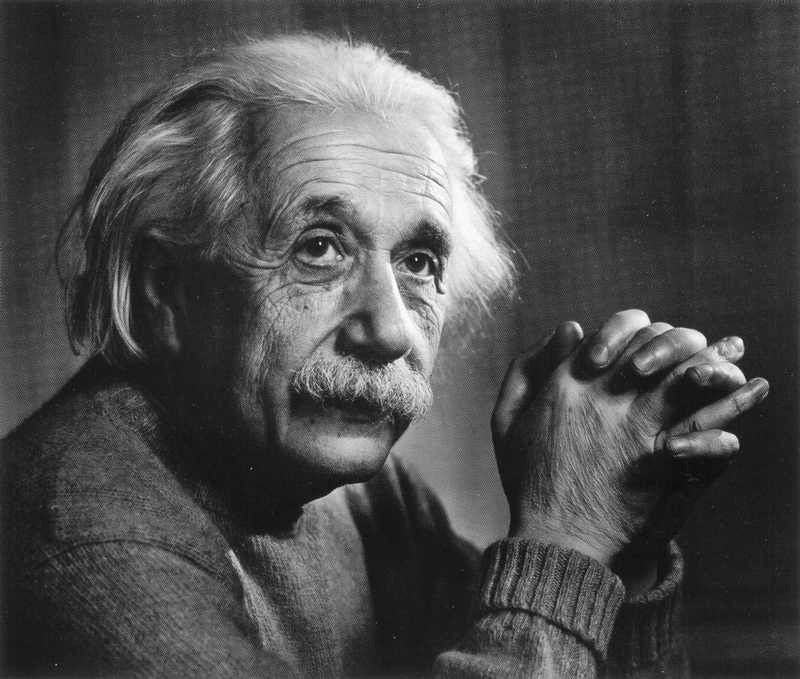

In [20]:
einstein = cv2.imread('Einstein.tif')
cv2_imshow(einstein)

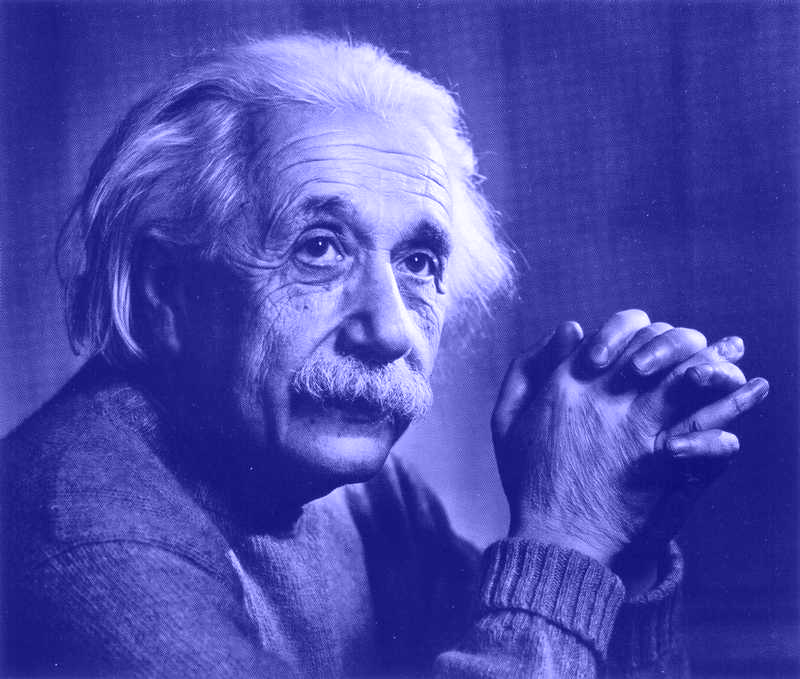

In [21]:
einstein_soma = cv2.add(einstein, 100)
cv2_imshow(einstein_soma)

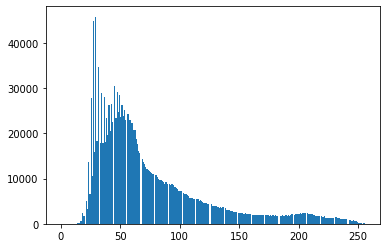

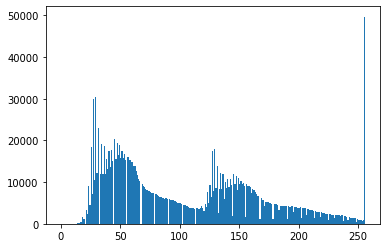

In [22]:
# imagem original
plt.hist(einstein.ravel(),256,[0,256])

plt.show()

# imagem constraste

plt.hist(einstein_soma.ravel(),256,[0,256])

plt.show()

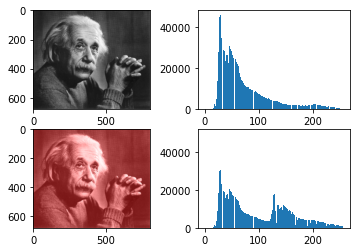

In [23]:
plt.subplot(221), plt.imshow(einstein,'gray')
plt.subplot(222), plt.hist(einstein.ravel(),256,[0,256])
plt.subplot(223), plt.imshow(einstein_soma)
plt.subplot(224), plt.hist(einstein_soma.ravel(),256,[0,256])
plt.show()

In this this add function caused the colors of the pixels to shift to -20 levels of gray, as we can see in the histogram of the second image, this one came closer to the gray level


In [24]:
jetplane = cv2.imread('jetplane.tif',0)
    

In [25]:
mascara = cv2.imread('jetplane_mask.jpg',0)

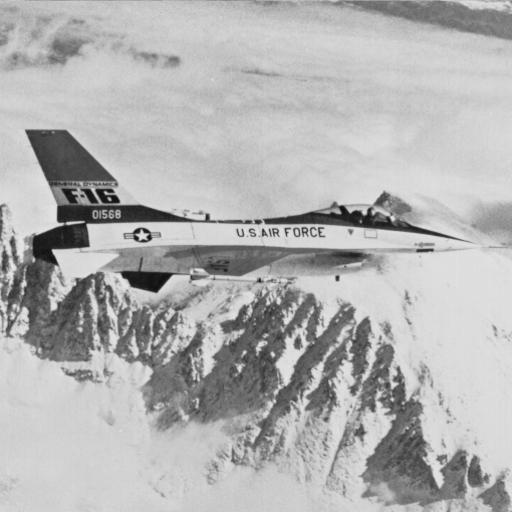

In [26]:
cv2_imshow(jetplane)



# Creating matrix with mask values


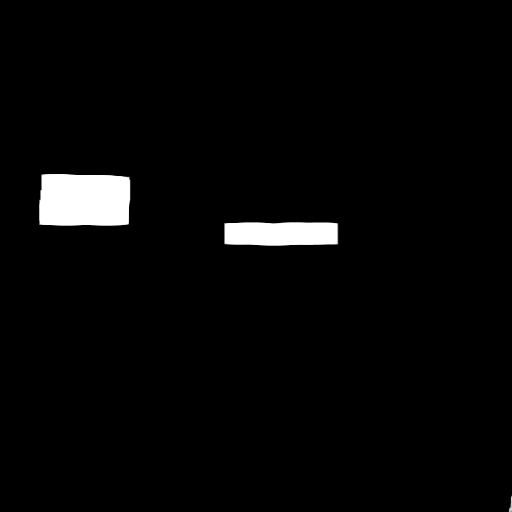

In [27]:

cv2_imshow(mascara)

In [28]:
jetplane_mask.shape

NameError: name 'jetplane_mask' is not defined

In [29]:
linha, coluna = mascara.shape

jetplane_mask = np.zeros([linha, coluna], dtype=int)

for i in range(len(jetplane_mask)): # NESTA LINHA VERIFICO O TAMANHO DE UMA LINHA DA IMAGEM E EXUCUTO UM LAÇÕ DE REPETIÇÃO COM ESSE TAMANHO
    for j in range(len(jetplane_mask[0])): # NESTE BLOCO EU PERCORO O TAMANHO DE UMA COLUNA 
        #print(jetplane[i][j])
        if mascara[i][j] > 0:
            jetplane_mask[i][j] = 1
        else:
            jetplane_mask[i][j] = 0

NO PROCESSO ABAIXO ESTAMOS MULTIPLICANDO A IMAGEM ORIGINA DO JETPLANE PELA NOSSA MASCARA, OU SEJA NOS PONTOS DA NOSSA MASCARA QUE QUEREMOS VISUALISAR NA IMAGEM RESULTANTE MULTIPLICAMOS A IMAGEM ORIGINAL POR ESTA MASCARA, POR ISSO PODEMOS VER AS INFORMAÇÕES DO CORPO DA AERONAVE E SUA CALDA

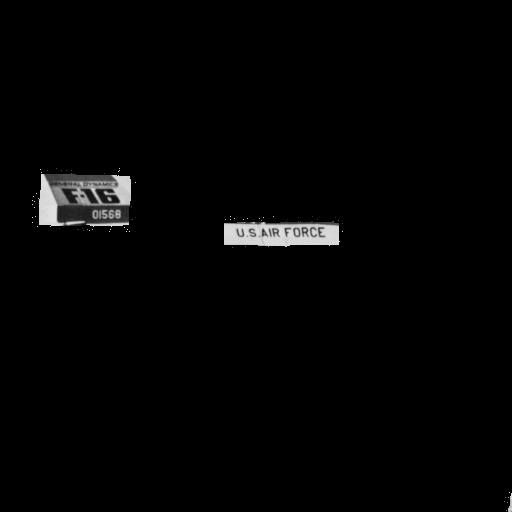

In [30]:
jetplane_res = cv2.multiply(jetplane.astype(float), jetplane_mask.astype(float))
cv2_imshow(jetplane_res)

# cv2.destroyAllWindows()}


In [31]:
baboo = cv2.imread('baboo.tif', 0)

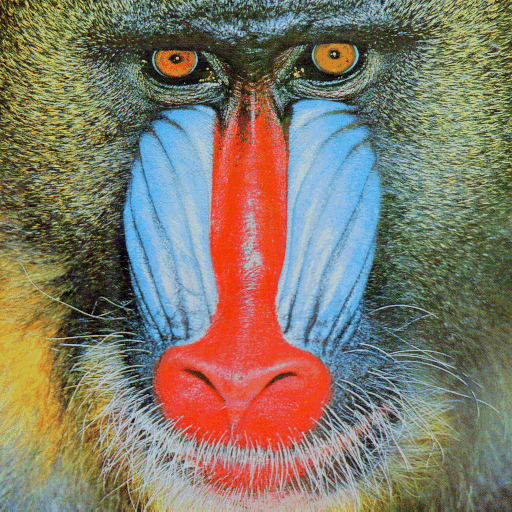

In [32]:
baboo = cv2.imread('baboo.tif')

cv2_imshow(baboo)

In [33]:
def logo(img_src, img_logo):
    center = [239, 384] # POSIÇÃO CENTRAL DO NARIZ DO BABOO
    linha, coluna, canais = img_logo.shape
    img_cut = img_src[center[1]-int(linha/2):center[1]+int(linha/2), center[0]-int(coluna/2):center[0]+int(coluna/2)]
    
    img_cinza = cv2.cvtColor(img_logo,cv2.COLOR_BGR2GRAY)
    ret, mask = cv2.threshold(img_cinza, 120, 255, cv2.THRESH_BINARY)
    mask_inv = cv2.bitwise_not(mask)
    
    img_and = cv2.bitwise_and(img_cut,img_cut,mask = mask_inv)
    img_ref = cv2.bitwise_and(img_logo,img_logo,mask = mask)
    res = cv2.add(img_and, img_ref)

    img_src[center[1]-int(linha/2):center[1]+int(linha/2), center[0]-int(coluna/2):center[0]+int(coluna/2)] = res
    
    return img_src

LOGOTIPO

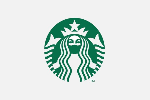

In [34]:
mask = cv2.imread('star.jpg')
mask = cv2.resize(mask, (150, 100)) 
cv2_imshow(mask)

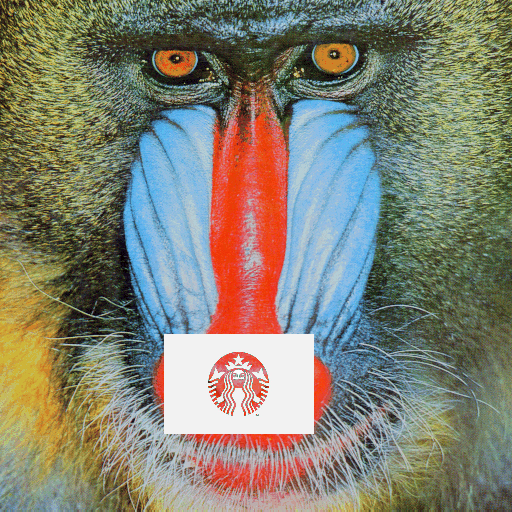

In [35]:
cv2_imshow(logo(baboo, mask))